[Leveraging ESG Data to Operationalize Sustainability. November 11, 2020. Antoine Amend. Databricks](https://www.databricks.com/blog/2020/11/11/leveraging-esg-data-to-operationalize-sustainability.html)

https://www.databricks.com/notebooks/esgops_notebooks/02_vessel_trips.html

https://marinecadastre.gov/data/

[Office for Coastal Management, 2023: Nationwide Automatic Identification System 2022, https://www.fisheries.noaa.gov/inport/item/67336](https://www.fisheries.noaa.gov/inport/item/67336)

https://coast.noaa.gov/data/marinecadastre/ais/data-dictionary.pdf

### M.1371 : Technical characteristics for an automatic identification system using time division multiple access in the VHF maritime mobile frequency band (Rec. ITU-R M.1371-5 )

https://www.itu.int/rec/R-REC-M.1371-5-201402-I/en

| Identifier No. | Vessel Type                                                  |
| -------------- | ------------------------------------------------------------ |
| 50             | Special craft                                                |
| 51             | Pilot vessel                                                 |
| 52             | Search and rescue vessels                                    |
| 53             | Tugs                                                         |
| 54             | Port tenders                                                 |
| 55             | Vessels with anti-pollution facilities or equipment          |
| 56             | Law enforcement vessels                                      |
| 57             | Spare – for assignments to local vessels                     |
| 58             | Spare – for assignments to local vessels                     |
| 59             | Medical transports (as defined in the 1949 Geneva Conventions and Additional Protocols) |
| 60             | Ships and aircraft of States not parties to an armed conflict |
| 0X             | Fishing vessels                                              |
| 1X             | Carrying dangerous goods (DG), harmful substances (HS), or marine pollutants (MP), or IMO hazard or pollutant category X |
| 2X             | Towing vessels                                               |
| 3X             | Vessels engaged in dredging or underwater operations         |
| 4X             | Vessels engaged in diving operations                         |
| 5X             | Reserved for future use                                      |
| 6X             | Passenger ships                                              |
| 7X             | Cargo ships                                                  |
| 8X             | Tankers                                                      |
| 9X             | Other types of ships                                         |

Table 53: Identifiers to be used by ships to report their type (Rec. ITU-R M.1371-5)

In [0]:
spark.table("ais.june_cargo").printSchema()

root
 |-- MMSI: string (nullable = true)
 |-- BaseDateTime: timestamp (nullable = true)
 |-- LAT: double (nullable = true)
 |-- LON: double (nullable = true)
 |-- SOG: double (nullable = true)
 |-- COG: double (nullable = true)
 |-- Heading: double (nullable = true)
 |-- VesselName: string (nullable = true)
 |-- IMO: string (nullable = true)
 |-- CallSign: string (nullable = true)
 |-- VesselType: integer (nullable = true)
 |-- Status: integer (nullable = true)
 |-- Length: double (nullable = true)
 |-- Width: double (nullable = true)
 |-- Draft: double (nullable = true)
 |-- Cargo: string (nullable = true)
 |-- TranscieverClass: string (nullable = true)
 |-- filename: string (nullable = true)



In [0]:
spark.table("ais.UpdatedPub150_US").printSchema()

root
 |-- World_Port_Index_Number: integer (nullable = true)
 |-- Region_Name: string (nullable = true)
 |-- Main_Port_Name: string (nullable = true)
 |-- Alternate_Port_Name: string (nullable = true)
 |-- UN/LOCODE: string (nullable = true)
 |-- Country_Code: string (nullable = true)
 |-- World_Water_Body: string (nullable = true)
 |-- IHO_S-130_Sea_Area: string (nullable = true)
 |-- Sailing_Direction_or_Publication: string (nullable = true)
 |-- Publication_Link: string (nullable = true)
 |-- Standard_Nautical_Chart: string (nullable = true)
 |-- IHO_S-57_Electronic_Navigational_Chart: string (nullable = true)
 |-- IHO_S-101_Electronic_Navigational_Chart: string (nullable = true)
 |-- Digital_Nautical_Chart: string (nullable = true)
 |-- Tidal_Range__m_: double (nullable = true)
 |-- Entrance_Width__m_: double (nullable = true)
 |-- Channel_Depth__m_: double (nullable = true)
 |-- Anchorage_Depth__m_: double (nullable = true)
 |-- Cargo_Pier_Depth__m_: double (nullable = true)
 |-- 

In [0]:
%scala
import org.apache.spark.sql.functions._

val topCargos = spark
  .read
  .table("ais.june_cargo")
  .groupBy("MMSI")
  .count()

val topCargosArray = topCargos.select("MMSI").as[String].collect()

val filteredCargos = topCargos.filter(col("count") > 15000)
val count = filteredCargos.count()

val topCargosList = filteredCargos.select("MMSI")
  .rdd
  .map(_.getString(0))
  .collect()

val topCargos_B = spark.sparkContext.broadcast(topCargosList)

println(s"The number of cargos with more than 15k data points: $count")


The number of cargos with more than 15k data points: 141
import org.apache.spark.sql.functions._
topCargos: org.apache.spark.sql.DataFrame = [MMSI: string, count: bigint]
topCargosArray: Array[String] = Array(244301000, 212370000, 538008006, 306216000, 563079000, 367147480, 477748900, 538009271, 538009721, 354857000, 218474000, 304010618, 414145000, 316001717, 720181000, 636091346, 245639000, 538003366, 255806378, 374213000, 636020563, 305056000, 636092330, 215223000, 477345200, 636021625, 367531780, 538007459, 636017306, 353093000, 414031000, 316001701, 369751000, 636017730, 366562000, 305063000, 371140000, 636016445, 538005112, 311003500, 566088000, 636014573, 357147000, 311296000, 367641230, 440194000, 538005716, 367049000, 355808000, 248505000, 538009053, 372158000, 370375000, 636018470, 241768000, 477661400, 431332000, 477105200, 368183000, 255805803, 636018592, 209570000, 256058000, 441344000, 477925400, 366576000, 636015594, 636016126, 316034372, 477319300, 229125000, 538007506, 372918000, 356777000, 565382000, 576532000, 636017994, 538005977, 477464100, 477117900, 356565000, 374706000, 372309000, 563142800, 356449000, 636016432, 477588100, 316001796, 253068000, 316047565, 316023341, 311056900, 372140000, 538007479, 357104000, 538002631, 367578740, 255805897, 235102679, 636092392, 636017242, 354591000, 305200000, 306140000, 576327000, 316009457, 373695000, 636018230, 636019162, 338701000, 538007480, 259099000, 538007093, 563143100, 373874000, 316004910, 477933000, 316001834, 228340900, 355077000, 538005675, 235095836, 314626000, 235067944, 636012808, 353934000, 354519000, 316014060, 366235000, 477066700, 477510600, 636092792, 371134000, 636018914, 351047000, 368251670, 538007976, 373821000, 249319000, 367276000, 248179000, 255806034, 636091270, 413198000, 477735900, 253172000, 304489000, 377908000, 477514700, 220595000, 220221000, 636092706, 477810600, 246100000, 356727000, 316009090, 538006434, 636021198, 215228000, 538006207, 538008171, 477387400, 538008977, 563159900, 366794000, 477244300, 209136000, 366893910, 309689000, 636015840, 477477200, 311000818, 351248000, 538004093, 367093000, 477441400, 352986151, 212276000, 311088000, 373403000, 538003568, 351468000, 311000384, 477398000, 538009732, 636020518, 440176000, 266338000, 355068000, 368225930, 566853000, 477547100, 538004646, 355702000, 255806180, 538008924, 577238000, 245226000, 209593000, 371059000, 210684000, 256820000, 477776300, 374069000, 566829000, 338078000, 538090070, 245227000, 563509000, 431585000, 372043000, 372805000, 477462400, 351398000, 372610000, 303944000, 636013086, 414546000, 303924000, 538006453, 354751000, 538009295, 372267000, 311029200, 538008176, 255806283, 563247000, 235070715, 366904940, 352157000, 566399000, 636018070, 256682000, 538003993, 218650000, 240203000, 367082220, 352649000, 563150600, 636017052, 374661000, 564050000, 248140000, 367769470, 316001804, 538008689, 210959000, 477832500, 311000415, 356398000, 538009564, 210970000, 368784000, 367782370, 367781630, 369285000, 477293100, 477852900, 338760000, 538005470, 636092313, 538005113, 341295000, 255805785, 355073000, 563006900, 403522001, 345050081, 538009561, 477182300, 235073372, 352001173, 305469000, 371707000, 316164000, 258014000, 244820000, 538009388, 477793400, 477581100, 305134000, 563005600, 357988000, 219117000, 311024300, 477410900, 215047000, 636092793, 538005154, 373120000, 255805360, 367196000, 477768100, 314600000, 229947000, 311000104, 212719000, 304906000, 372071000, 372038000, 215678000, 338121000, 577403000, 538006631, 218092000, 636010697, 477197100, 256075000, 577297000, 235010440, 538006995, 353074000, 345070267, 636020235, 314295000, 370458000, 249431000, 357772000, 373622000, 567438000, 257481000, 210234000, 636020371, 538005592, 538007158, 538009948, 477136800, 368106220, 355853000, 215475000, 538009652, 636018377, 563080300, 235093618, 636091731, 373114000, 257842000, 636011285, 477625800, 636017264, 271043028, 244149000, 316023808, 538009370, 3712430

In [0]:
%scala
import org.apache.spark.sql.functions._
import org.apache.spark.sql.expressions.Window
import java.sql.Timestamp

// Define a UDF to calculate the time difference between two timestamps in minutes
val deltaT = udf((x1: Timestamp, x2: Timestamp) => {
  scala.util.Try((x2.getTime - x1.getTime) / 60000).getOrElse(0L)
})

val rankedCargos = spark.read.table("ais.june_cargo")
  .withColumn("rank", dense_rank().over(Window.partitionBy(col("MMSI")).orderBy(col("BaseDateTime"))))
  .withColumn("nextTs", lead("BaseDateTime", 1).over(Window.partitionBy(col("MMSI")).orderBy(col("BaseDateTime"))))
  .withColumn("deltaT", deltaT(col("BaseDateTime"), col("nextTs")))
  .drop("nextTs")

import org.apache.spark.sql.functions._
import org.apache.spark.sql.expressions.Window
import java.sql.Timestamp
deltaT: org.apache.spark.sql.expressions.UserDefinedFunction = SparkUserDefinedFunction($Lambda$12973/201079407@25b7dd39,LongType,List(Some(class[value[0]: timestamp]), Some(class[value[0]: timestamp])),Some(class[value[0]: bigint]),None,false,true)
rankedCargos: org.apache.spark.sql.DataFrame = [MMSI: string, BaseDateTime: timestamp ... 18 more fields]

In [0]:
%scala
import java.sql.Timestamp

// Define a case class to represent the attributes of a vessel within a partition
case class VesselAtt(
  BaseDateTime: Timestamp,
  deltaT: Long,
  LAT: Double,
  LON: Double,
  Heading: Double,
  Status: Int,
  SOG: Double
)

// Include the timestamp (ranked in a previous step) in the key for secondary sorting
case class VesselKey(
  MMSI: String,
  rank: Long
)

// Create a companion object to specify how to sort the keys
// The records will be sorted in ascending order based on the rank derived from the BaseDateTime
object VesselKey {
  implicit def orderingByRank[A <: VesselKey]: Ordering[A] = {
    Ordering.by(fk => (fk.rank))
  }
}

import java.sql.Timestamp
defined class VesselAtt
defined class VesselKey
defined object VesselKey

In [0]:
%scala
import org.apache.spark.Partitioner

class VesselKeyPartitioner(topCargos: Array[String]) extends Partitioner {

  // We start with a number of partitions equal to twice the number of top cargos
  override def numPartitions: Int = topCargos.length * 2

  // We assign a specific partition for each incoming record (a VesselKey)
  override def getPartition(key: Any): Int = {
    val k = key.asInstanceOf[VesselKey]
    val sharedPartitions = numPartitions - topCargos.length

    if (topCargos.contains(k.MMSI)) {
      // Top cargos are sent to their dedicated partition
      sharedPartitions + topCargos.indexOf(k.MMSI)
    } else {
      // Other cargos are distributed among shared partitions
      math.abs(k.MMSI.hashCode % sharedPartitions)
    }
  }
}

import org.apache.spark.Partitioner
defined class VesselKeyPartitioner

In [0]:
%scala
// Split an iterator into multiple iterators based on a breaking condition
// We'll return an iterator of sessions, processing one session at a time
def iterativeSplit[T](iter: Iterator[T])(breakOn: T => Boolean): Iterator[List[T]] = {
  new Iterator[List[T]] {
    def hasNext: Boolean = iter.hasNext
    def next(): List[T] = {
      if (iter.hasNext) {
        val cur = iter.next() +: iter.takeWhile(!breakOn(_)).toList
        iter.dropWhile(!breakOn(_))
        cur
      } else {
        Nil
      }
    }
  }.withFilter(_.nonEmpty)
}

iterativeSplit: [T](iter: Iterator[T])(breakOn: T => Boolean)Iterator[List[T]]

In [0]:
%scala
val cargoPointsRdd = rankedCargos.rdd.map(r => {
  (
    VesselKey(
      r.getAs[String]("MMSI"),
      r.getAs[Int]("rank")
    ),
    VesselAtt(
      r.getAs[java.sql.Timestamp]("BaseDateTime"),
      r.getAs[Long]("deltaT"),
      r.getAs[Double]("LAT"),
      r.getAs[Double]("LON"),
      r.getAs[Double]("Heading"),
      r.getAs[Int]("Status"),
      r.getAs[Double]("SOG")
    )
  )
})

// apply secondary sort to group and order points at a partition level
.repartitionAndSortWithinPartitions(new VesselKeyPartitioner(topCargosArray))
// all points for a given partition are ordered by timestamp
.mapPartitionsWithIndex({ case (pId, it) =>
  // We split by trips separated by moored / anchored ship or if MMSI has changed (new rank ordered) or if points are more than 1d apart
  val breakOn = (kv: (VesselKey, VesselAtt)) => {Set(1, 2, 5, 6).contains(kv._2.Status) || kv._1.rank == 1 || kv._2.deltaT > 24 * 60}
  iterativeSplit(it)(breakOn).zipWithIndex.flatMap({ case (session, sessionId) =>
    // We assign a trip Id using index of the partition and index of the split
    val uuid = s"${pId}-${sessionId}"
    session.dropWhile(_._2.SOG == 0).map({ case (key, att) =>
  (uuid, key.MMSI, att.BaseDateTime, att.LAT, att.LON, att.SOG, att.Heading)
})
  })
})

cargoPointsRdd: org.apache.spark.rdd.RDD[(String, String, java.sql.Timestamp, Double, Double, Double, Double)] = MapPartitionsRDD[1065] at mapPartitionsWithIndex at command-189933159199525:22

In [0]:
%scala
val cargoPoints = cargoPointsRdd.toDF("tripId", "MMSI", "BaseDateTime", "LAT", "LON", "SOG", "Heading")
cargoPoints.write.format("delta").mode("overwrite").saveAsTable("ais.june_cargo_points")

cargoPoints: org.apache.spark.sql.DataFrame = [tripId: string, MMSI: string ... 5 more fields]

In [0]:
%sql
OPTIMIZE ais.june_cargo_points ZORDER BY (tripId)

path,metrics
dbfs:/user/hive/warehouse/ais.db/june_cargo_points,"List(1, 3021, List(250297686, 250297686, 2.50297686E8, 1, 250297686), List(1728, 722065, 85242.69281694802, 3021, 257518175), 0, List(minCubeSize(107374182400), List(0, 0), List(3021, 257518175), 0, List(3021, 257518175), 1, null), 1, 3021, 0, false, 0, 0, 1684290658971, 1684290682063, 32, 1, null)"


In [0]:
%scala
case class GeoPoint(latitude: Double, longitude: Double) 

object GeoUtils {
  // Haversine distance implementation in KM
  val AVERAGE_RADIUS_OF_EARTH = 6371
  def distance(start: GeoPoint, stop: GeoPoint): Double = {
      val latDistance = Math.toRadians(start.latitude - stop.latitude)
      val lngDistance = Math.toRadians(start.longitude - stop.longitude)
      val sinLat = Math.sin(latDistance / 2)
      val sinLng = Math.sin(lngDistance / 2)
      val a = sinLat * sinLat + (Math.cos(Math.toRadians(start.latitude)) * Math.cos(Math.toRadians(stop.latitude)) * sinLng * sinLng)
      val c = 2 * Math.atan2(Math.sqrt(a), Math.sqrt(1 - a))
      (AVERAGE_RADIUS_OF_EARTH * c)
  }
}

// We create a user defined function that returns distance in Km between 2 distinct points
val distance = udf((startLatitude: Double, startLongitude: Double, stopLatitude: Double, stopLongitude: Double) => {
  scala.util.Try {
    GeoUtils.distance(
      GeoPoint(startLatitude, startLongitude),
      GeoPoint(stopLatitude, stopLongitude)
    )
  }.getOrElse(0.0)
})

defined class GeoPoint
defined object GeoUtils
distance: org.apache.spark.sql.expressions.UserDefinedFunction = SparkUserDefinedFunction($Lambda$12977/221510881@64a591f,DoubleType,List(Some(class[value[0]: double]), Some(class[value[0]: double]), Some(class[value[0]: double]), Some(class[value[0]: double])),Some(class[value[0]: double]),None,false,true)

In [0]:
%scala
import org.apache.spark.sql.functions._
import org.apache.spark.sql.expressions.Window

val trips = spark.read.table("ais.june_cargo_points")
  .withColumn("s", struct(col("LAT"), col("LON")))
  .withColumn("n", lead("s", 1).over(Window.partitionBy(col("MMSI")).orderBy(col("BaseDateTime"))))
  // compute distance from any point to its next
  .withColumn("distance", distance(col("s.LAT"), col("s.LON"), col("n.LAT"), col("n.LON")))
  .groupBy("tripId", "MMSI")
  .agg(
    first("BaseDateTime").as("orgTime"),
    last("BaseDateTime").as("dstTime"),
    first(struct(col("LAT"), col("LON"))).as("orgGeo"),
    last(struct(col("LAT"), col("LON"))).as("dstGeo"),
    sum("distance").as("distance")
  )
  .cache()

display(trips)

tripId,MMSI,orgTime,dstTime,orgGeo,dstGeo,distance
3064-0,244301000,2022-06-04T20:10:03.000+0000,2022-06-06T23:21:54.000+0000,"List(39.92636, -68.20258)","List(39.24679, -76.53856)",1045.6836690873215
3064-1022,244301000,2022-06-13T22:11:25.000+0000,2022-06-13T22:11:25.000+0000,"List(42.62686, -73.75518)","List(42.62686, -73.75518)",8.181496866868505E-4
3064-1032,244301000,2022-06-13T23:17:51.000+0000,2022-06-13T23:17:51.000+0000,"List(42.62686, -73.75519)","List(42.62686, -73.75519)",0.0013805071432171348
3064-1096,244301000,2022-06-14T06:02:47.000+0000,2022-06-14T06:02:47.000+0000,"List(42.62687, -73.7552)","List(42.62687, -73.7552)",0.009478476028345196
3064-1145,244301000,2022-06-14T10:58:57.000+0000,2022-06-14T10:58:57.000+0000,"List(42.62679, -73.75516)","List(42.62679, -73.75516)",0.09706282968746166
3064-1146,244301000,2022-06-14T11:04:59.000+0000,2022-06-14T11:04:59.000+0000,"List(42.62594, -73.75543)","List(42.62594, -73.75543)",0.10928794495226897
3064-1147,244301000,2022-06-14T11:11:01.000+0000,2022-06-14T11:11:01.000+0000,"List(42.62502, -73.7559)","List(42.62502, -73.7559)",0.1261647168179054
3064-1148,244301000,2022-06-14T11:17:03.000+0000,2022-06-14T11:17:03.000+0000,"List(42.62396, -73.75645)","List(42.62396, -73.75645)",0.02873059569973416
3064-1149,244301000,2022-06-14T11:23:08.000+0000,2022-06-14T11:23:08.000+0000,"List(42.62373, -73.75661)","List(42.62373, -73.75661)",0.008084070039818569
3064-1159,244301000,2022-06-14T12:23:31.000+0000,2022-06-14T12:23:31.000+0000,"List(42.62376, -73.7567)","List(42.62376, -73.7567)",8.181904274607991E-4


In [0]:
%scala
import com.uber.h3core.H3Core
import com.uber.h3core.util.GeoCoord
import com.uber.h3core.LengthUnit
import scala.collection.JavaConversions._
import scala.collection.mutable.ListBuffer
import scala.collection.JavaConverters._
import org.apache.spark.sql.functions._

// We create a User defined function to convert a point into polygon given a resolution
// Given a point to encode (latitude and longitude) and a resolution
// We return the hexadecimal representation of the corresponding H3 polygon
val toH3 = udf((lat: Double, lon: Double, res: Int) => {
  require(res <= 12 && res > 0, "Resolution should be positive integer < 12")
  val h3 = H3Core.newInstance()
  val h3Long = h3.geoToH3(lat, lon, res)
  f"$h3Long%X"
})

// We fill a predefined radius with as many poylgons as required given a resolution
// Given a point to encode (latitude and longitude), a resolution and a radius in Km
// We return all H3 polygons fiting our circle, encoded in their hexadecimal representations
val toH3Ring = udf((lat: Double, lon: Double, radiusKm: Int, res: Int) => {
  require(res <= 12 && res > 0, "Resolution should be positive integer < 12")
  require(radiusKm > 0, "Radius should be positive integer")
  val h3 = H3Core.newInstance()
  val origin = h3.geoToH3(lat, lon, res)
  val radius = Math.floor(radiusKm / (h3.edgeLength(res, LengthUnit.km) * 2))
  h3.kRing(origin, radius.toInt).map(h3Long => f"$h3Long%X")
})

// We register both UDFs so that we make our code portable between python and scala (via SQL)
spark.udf.register("h3", toH3)
spark.udf.register("h3_ring", toH3Ring)

command-97616581672682:28: warning: object JavaConversions in package collection is deprecated (since 2.12.0): use JavaConverters
 h3.kRing(origin, radius.toInt).map(h3Long => f"$h3Long%X")
 ^
import com.uber.h3core.H3Core
import com.uber.h3core.util.GeoCoord
import com.uber.h3core.LengthUnit
import scala.collection.JavaConversions._
import scala.collection.mutable.ListBuffer
import scala.collection.JavaConverters._
import org.apache.spark.sql.functions._
toH3: org.apache.spark.sql.expressions.UserDefinedFunction = SparkUserDefinedFunction($Lambda$12978/1455478756@7d38cb76,StringType,List(Some(class[value[0]: double]), Some(class[value[0]: double]), Some(class[value[0]: int])),Some(class[value[0]: string]),None,true,true)
toH3Ring: org.apache.spark.sql.expressions.UserDefinedFunction = SparkUserDefinedFunction($Lambda$12979/587065519@46d595d1,ArrayType(StringType,true),List(Some(class[value[0]: double]), Some(class[value[0]: double]), Some(class[value[0]: int]), Some(class[value[0]: int])),Some(class[value[0]: array<string>]),None,true,true)
res7: org.apache.spark.sql.expressions.UserDefinedFunction = SparkUserDefinedFunction($Lambda$12979/587065519@46d595d1,ArrayType(StringType,true),List(Some(class[value[0]: double]), Some(class[value[0]: double]), Some(class[value[0]: int]), Some(class[value[0]: int])),Some(class[value[0]: array<string>]),Some(h3_ring),true,true)

In [0]:
%scala
// Index ports on a 40km radius
// Granularity of 5 covers radius with enough polygons
val optimalRes = 5
val portIndexDf = spark.read.table("ais.UpdatedPub150_US")
  .withColumn("hexagons", toH3Ring(col("Latitude"), col("Longitude"), lit(40), lit(optimalRes)))
  .withColumn("portLocation", toH3(col("Latitude"), col("Longitude"), lit(10)))
  .select(col("World_Port_Index_Number"), col("Main_Port_Name"), col("portLocation"), explode(col("hexagons")).as("h3"))
  .cache()

display(portIndexDf)

World_Port_Index_Number,Main_Port_Name,portLocation,h3
7950,Maurer,8A2A1061B86FFFF,852A1063FFFFFFF
7950,Maurer,8A2A1061B86FFFF,852A107BFFFFFFF
7950,Maurer,8A2A1061B86FFFF,852A106BFFFFFFF
7950,Maurer,8A2A1061B86FFFF,852A106FFFFFFFF
7950,Maurer,8A2A1061B86FFFF,852A1067FFFFFFF
7950,Maurer,8A2A1061B86FFFF,852A1077FFFFFFF
7950,Maurer,8A2A1061B86FFFF,852A1073FFFFFFF
7950,Maurer,8A2A1061B86FFFF,852A1047FFFFFFF
7950,Maurer,8A2A1061B86FFFF,852A104FFFFFFFF
7950,Maurer,8A2A1061B86FFFF,852A12B7FFFFFFF


In [0]:
%scala
portIndexDf.printSchema()

root
-- World_Port_Index_Number: integer (nullable = true)
-- Main_Port_Name: string (nullable = true)
-- portLocation: string (nullable = true)
-- h3: string (nullable = true)

In [0]:
%scala
import java.sql.Timestamp
import org.apache.spark.sql.functions._
val hour_diff = udf((fromTimestamp: Timestamp, toTimestamp: Timestamp) => {
  scala.util.Try((toTimestamp.getTime - fromTimestamp.getTime) / 3600000.0).getOrElse(0.0)
})

import java.sql.Timestamp
import org.apache.spark.sql.functions._
hour_diff: org.apache.spark.sql.expressions.UserDefinedFunction = SparkUserDefinedFunction($Lambda$12980/1294511396@59fb5f0d,DoubleType,List(Some(class[value[0]: timestamp]), Some(class[value[0]: timestamp])),Some(class[value[0]: double]),None,false,true)

In [0]:
spark.sql("DROP TABLE ais.june_cargo_trips")

Out[4]: DataFrame[]

In [0]:
dbutils.fs.rm("dbfs:/delta/default/ais/june_cargo_trips", recurse=True)

Out[5]: False

In [0]:
%scala
import org.apache.spark.sql.Row
import org.apache.spark.sql.DataFrame

case class Port(World_Port_Index_Number: Int, Main_Port_Name: String)

// A specific location may match multiple polygons from different ports
// We find the port with the most overlapping polygons (maximizing Jaccard coefficient)
val getPortCandidate = udf((xs: Seq[Row]) => {
  val b = xs.maxBy(_.getAs[Long]("count"))
  Port(b.getAs[Int]("World_Port_Index_Number"), b.getAs[String]("Main_Port_Name"))
})

// We ensure to use the same granularity as per the catchment area so that we can join both datasets on H3
def getPort(df: DataFrame): DataFrame = {
  df
    .select(col("tripId"), toH3(col("LAT"), col("LON"), lit(5)).as("h3"))
    .join(portIndexDf, List("h3"))
    .groupBy("tripId", "World_Port_Index_Number", "Main_Port_Name")
    .count()
    .withColumn("port", struct(col("World_Port_Index_Number"), col("Main_Port_Name"), col("count")))
    .groupBy("tripId")
    .agg(collect_list(col("port")).as("candidates"))
    .select(col("tripId"), getPortCandidate(col("candidates")).as("port"))  
}

// Run the process twice, once for the originating port and once for the destination port
// We only keep the inner join, hence ignoring trips originating/at the destination outside of the US
val orgPortDf = getPort(trips.select("tripId", "orgGeo.LAT", "orgGeo.LON")).withColumnRenamed("port", "orgPort")
val dstPortDf = getPort(trips.select("tripId", "dstGeo.LAT", "dstGeo.LON")).withColumnRenamed("port", "dstPort")
val portDf = orgPortDf.join(dstPortDf, List("tripId"))

trips
  .join(portDf, List("tripId"))
  .select(
    col("tripId"),
    col("MMSI"),
    hour_diff(col("orgTime"), col("dstTime")).as("duration"),
    col("distance"),
    col("orgTime"),
    col("orgGeo"),
    col("orgPort.World_Port_Index_Number").as("orgPortId"),
    col("orgPort.Main_Port_Name").as("orgPortName"),
    col("dstTime"),
    col("dstGeo"),
    col("dstPort.World_Port_Index_Number").as("dstPortId"),
    col("dstPort.Main_Port_Name").as("dstPortName")
  )
  .filter(col("orgPortId") =!= col("dstPortId"))
  .filter(col("distance") > 0) // must have sailed at least one nautical mile
  .filter(col("duration") > 5) // must have been sailing for at least 5 hours
  .write
  .format("delta")
  .mode("overwrite")
  .saveAsTable("ais.june_cargo_trips")

import org.apache.spark.sql.Row
import org.apache.spark.sql.DataFrame
defined class Port
getPortCandidate: org.apache.spark.sql.expressions.UserDefinedFunction = SparkUserDefinedFunction($Lambda$12983/1452211576@3d4e23a0,StructType(StructField(World_Port_Index_Number,IntegerType,false),StructField(Main_Port_Name,StringType,true)),List(None),Some(class[World_Port_Index_Number[0]: int, Main_Port_Name[0]: string]),None,true,true)
getPort: (df: org.apache.spark.sql.DataFrame)org.apache.spark.sql.DataFrame
orgPortDf: org.apache.spark.sql.DataFrame = [tripId: string, orgPort: struct<World_Port_Index_Number: int, Main_Port_Name: string>]
dstPortDf: org.apache.spark.sql.DataFrame = [tripId: string, dstPort: struct<World_Port_Index_Number: int, Main_Port_Name: string>]
portDf: org.apache.spark.sql.DataFrame = [tripId: string, orgPort: struct<World_Port_Index_Number: int, Main_Port_Name: string> ... 1 more field]

In [0]:
%sql
OPTIMIZE ais.june_cargo_trips ZORDER BY (tripId, orgPortId, dstPortId)

path,metrics
dbfs:/user/hive/warehouse/ais.db/june_cargo_trips,"List(8, 21, List(14623, 29469, 20790.125, 8, 166321), List(9561, 12858, 11416.095238095239, 21, 239738), 0, List(minCubeSize(107374182400), List(0, 0), List(21, 239738), 0, List(21, 239738), 1, null), 1, 21, 0, false, 0, 0, 1684292132177, 1684292136334, 20, 1, null)"


In [0]:
%sql
SELECT * FROM ais.june_cargo_trips
ORDER BY duration DESC

tripId,MMSI,duration,distance,orgTime,orgGeo,orgPortId,orgPortName,dstTime,dstGeo,dstPortId,dstPortName
4125-0,367050160,719.9852777777778,8316.76885547139,2022-06-01T00:00:04.000+0000,"List(44.65773, -86.51906)",4640,Frankfort,2022-06-30T23:59:11.000+0000,"List(41.63961, -87.14759)",4760,Gary
3090-0,367531780,719.9844444444444,3647.800844494349,2022-06-01T00:00:07.000+0000,"List(29.96193, -90.39597)",8930,Reserve,2022-06-30T23:59:11.000+0000,"List(29.93348, -90.35307)",8940,Destrehan
3806-0,367761740,719.9838888888889,118.84409812718226,2022-06-01T00:00:09.000+0000,"List(27.83357, -97.50168)",9300,Corpus Christi,2022-06-30T23:59:11.000+0000,"List(27.81879, -97.45051)",9290,Rockport
3592-0,367121040,719.9830555555556,7512.204676730984,2022-06-01T00:00:05.000+0000,"List(42.96377, -82.4192)",4330,Marine City,2022-06-30T23:59:04.000+0000,"List(41.49945, -81.70817)",3490,Cleveland
4958-0,366938710,719.9808333333333,8103.7046522907995,2022-06-01T00:00:04.000+0000,"List(45.84275, -85.04611)",4540,St Ignace,2022-06-30T23:58:55.000+0000,"List(45.65002, -86.33224)",5070,Nahma
4004-0,366938760,719.9794444444444,8293.160402404017,2022-06-01T00:00:06.000+0000,"List(43.99675, -82.52566)",4370,Harbor Beach,2022-06-30T23:58:52.000+0000,"List(42.90562, -82.46415)",4350,Port Huron
3527-3,636021123,716.7169444444445,19500.37670449417,2022-06-01T03:16:38.000+0000,"List(33.51153, -118.18583)",16050,Avalon,2022-06-30T23:59:39.000+0000,"List(37.79501, -122.31134)",16330,Alameda
4272-0,366930730,694.7558333333334,7328.634640707017,2022-06-01T16:29:46.000+0000,"List(46.58037, -87.38873)",5290,Presque Isle,2022-06-30T15:15:07.000+0000,"List(43.06534, -82.41515)",4350,Port Huron
4699-0,367389840,691.2886111111111,123.08541787792643,2022-06-02T04:41:58.000+0000,"List(37.92314, -122.36704)",16360,Berkeley,2022-06-30T23:59:17.000+0000,"List(37.92314, -122.36704)",16330,Alameda
3420-0,366906610,687.5602777777777,10070.088169027818,2022-06-02T08:26:01.000+0000,"List(46.75194, -92.13544)",5450,Superior,2022-06-30T23:59:38.000+0000,"List(45.4533, -83.43758)",4500,Rogers City


In [0]:
!pip install keplergl

  Using cached keplergl-0.3.2-py2.py3-none-any.whl
  Using cached shapely-2.0.1-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.3 MB)
  Using cached geopandas-0.13.0-py3-none-any.whl (1.1 MB)
  Using cached traittypes-0.2.1-py2.py3-none-any.whl (8.6 kB)
  Using cached pyproj-3.5.0-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (7.8 MB)
  Using cached Fiona-1.9.3-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.1 MB)
  Using cached cligj-0.7.2-py3-none-any.whl (7.1 kB)
  Using cached click_plugins-1.1.1-py2.py3-none-any.whl (7.5 kB)
  Using cached munch-3.0.0-py2.py3-none-any.whl (10 kB)
  Using cached importlib_metadata-6.6.0-py3-none-any.whl (22 kB)
  Using cached zipp-3.15.0-py3-none-any.whl (6.8 kB)
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-d204ea0b-da86-4958-a11a-85a30737ebc1/bin/python -m pip install --upgrade pip' command.


In [0]:
map_config={
  "version": "v1",
  "config": {
    "visState": {
      "filters": [],
      "layers": [
        {
          "id": "mg08ej3",
          "type": "hexagonId",
          "config": {
            "dataId": "hex_data",
            "label": "h3_res11",
            "color": [
              18,
              147,
              154
            ],
            "columns": {
              "hex_id": "h3_res11"
            },
            "isVisible": False,
            "visConfig": {
              "opacity": 0.8,
              "colorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "coverage": 1,
              "enable3d": False,
              "sizeRange": [
                0,
                500
              ],
              "coverageRange": [
                0,
                1
              ],
              "elevationScale": 5
            },
            "hidden": False,
            "textLabel": [
              {
                "field": None,
                "color": [
                  255,
                  255,
                  255
                ],
                "size": 18,
                "offset": [
                  0,
                  0
                ],
                "anchor": "start",
                "alignment": "center"
              }
            ]
          },
          "visualChannels": {
            "colorField": None,
            "colorScale": "quantile",
            "sizeField": None,
            "sizeScale": "linear",
            "coverageField": None,
            "coverageScale": "linear"
          }
        },
        {
          "id": "x1gdbyj",
          "type": "hexagonId",
          "config": {
            "dataId": "hex_data",
            "label": "h3_res10",
            "color": [
              221,
              178,
              124
            ],
            "columns": {
              "hex_id": "h3_res10"
            },
            "isVisible": False,
            "visConfig": {
              "opacity": 0.8,
              "colorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "coverage": 1,
              "enable3d": False,
              "sizeRange": [
                0,
                500
              ],
              "coverageRange": [
                0,
                1
              ],
              "elevationScale": 5
            },
            "hidden": False,
            "textLabel": [
              {
                "field": None,
                "color": [
                  255,
                  255,
                  255
                ],
                "size": 18,
                "offset": [
                  0,
                  0
                ],
                "anchor": "start",
                "alignment": "center"
              }
            ]
          },
          "visualChannels": {
            "colorField": None,
            "colorScale": "quantile",
            "sizeField": None,
            "sizeScale": "linear",
            "coverageField": None,
            "coverageScale": "linear"
          }
        },
        {
          "id": "xrdgt51",
          "type": "hexagonId",
          "config": {
            "dataId": "hex_data",
            "label": "h3_res9",
            "color": [
              136,
              87,
              44
            ],
            "columns": {
              "hex_id": "h3_res9"
            },
            "isVisible": False,
            "visConfig": {
              "opacity": 0.8,
              "colorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "coverage": 1,
              "enable3d": False,
              "sizeRange": [
                0,
                500
              ],
              "coverageRange": [
                0,
                1
              ],
              "elevationScale": 5
            },
            "hidden": False,
            "textLabel": [
              {
                "field": None,
                "color": [
                  255,
                  255,
                  255
                ],
                "size": 18,
                "offset": [
                  0,
                  0
                ],
                "anchor": "start",
                "alignment": "center"
              }
            ]
          },
          "visualChannels": {
            "colorField": None,
            "colorScale": "quantile",
            "sizeField": None,
            "sizeScale": "linear",
            "coverageField": None,
            "coverageScale": "linear"
          }
        },
        {
          "id": "etz6nbl",
          "type": "hexagonId",
          "config": {
            "dataId": "hex_data",
            "label": "h3_res8",
            "color": [
              125,
              177,
              227
            ],
            "columns": {
              "hex_id": "h3_res8"
            },
            "isVisible": True,
            "visConfig": {
              "opacity": 0.15,
              "colorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "coverage": 0.95,
              "enable3d": False,
              "sizeRange": [
                0,
                500
              ],
              "coverageRange": [
                0,
                1
              ],
              "elevationScale": 5
            },
            "hidden": False,
            "textLabel": [
              {
                "field": None,
                "color": [
                  255,
                  255,
                  255
                ],
                "size": 18,
                "offset": [
                  0,
                  0
                ],
                "anchor": "start",
                "alignment": "center"
              }
            ]
          },
          "visualChannels": {
            "colorField": None,
            "colorScale": "quantile",
            "sizeField": None,
            "sizeScale": "linear",
            "coverageField": None,
            "coverageScale": "linear"
          }
        },
        {
          "id": "jn27fi",
          "type": "hexagonId",
          "config": {
            "dataId": "hex_data",
            "label": "h3_res7",
            "color": [
              117,
              222,
              227
            ],
            "columns": {
              "hex_id": "h3_res7"
            },
            "isVisible": True,
            "visConfig": {
              "opacity": 0.31,
              "colorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "coverage": 0.98,
              "enable3d": False,
              "sizeRange": [
                0,
                500
              ],
              "coverageRange": [
                0,
                1
              ],
              "elevationScale": 5
            },
            "hidden": False,
            "textLabel": [
              {
                "field": None,
                "color": [
                  255,
                  255,
                  255
                ],
                "size": 18,
                "offset": [
                  0,
                  0
                ],
                "anchor": "start",
                "alignment": "center"
              }
            ]
          },
          "visualChannels": {
            "colorField": None,
            "colorScale": "quantile",
            "sizeField": None,
            "sizeScale": "linear",
            "coverageField": None,
            "coverageScale": "linear"
          }
        }
      ],
      "interactionConfig": {
        "tooltip": {
          "fieldsToShow": {
            "hex_data": [
              {
                "name": "h3_res11",
                "format": None
              },
              {
                "name": "h3_res10",
                "format": None
              },
              {
                "name": "h3_res9",
                "format": None
              },
              {
                "name": "h3_res8",
                "format": None
              },
              {
                "name": "h3_res7",
                "format": None
              }
            ]
          },
          "compareMode": False,
          "compareType": "absolute",
          "enabled": True
        },
        "brush": {
          "size": 0.5,
          "enabled": False
        },
        "geocoder": {
          "enabled": False
        },
        "coordinate": {
          "enabled": False
        }
      },
      "layerBlending": "subtractive",
      "splitMaps": [],
      "animationConfig": {
        "currentTime": None,
        "speed": 1
      }
    },
    "mapState": {
      "bearing": 0,
      "dragRotate": False,
      "latitude": 40,
      "longitude": -100,
      "pitch": 0,
      "zoom": 3.2,
      "isSplit": False
    },
    "mapStyle": {
      "styleType": "dark",
      "topLayerGroups": {},
      "visibleLayerGroups": {
        "label": True,
        "road": True,
        "border": False,
        "building": True,
        "water": True,
        "land": True,
        "3d building": False
      },
      "threeDBuildingColor": [
        9.665468314072013,
        17.18305478057247,
        31.1442867897876
      ],
      "mapStyles": {}
    }
  }
}

In [0]:
def create_kepler_html(data, config, height):
  map_1 = KeplerGl(height=height, data=data, config=config)
  html = map_1._repr_html_().decode("utf-8")
  new_html = html + """<script>
      var targetHeight = "{height}px";
      var interval = window.setInterval(function() {{
        if (document.body && document.body.style && document.body.style.height !== targetHeight) {{
          document.body.style.height = targetHeight;
        }}
      }}, 250);</script>""".format(height=height)
  return new_html

In [0]:
%python
from pyspark.sql import functions as F
from keplergl import KeplerGl 

trips = spark.read.table("ais.june_cargo_trips")
points = spark.read.table("ais.june_cargo_points")

df = trips \
  .join(points, ["tripId"]) \
  .withColumn("h3", F.expr("h3(LAT, LON, 6)")) \
  .groupBy("h3").count().toPandas()

In [0]:
result_html = create_kepler_html(data={"hex_data": df }, config=map_config, height=600)

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


In [0]:
from IPython.display import display, HTML
display(HTML(result_html))

<!doctype html> Kepler.gl

In [0]:
dbutils.fs.ls("/")

Out[42]: [FileInfo(path='dbfs:/FileStore/', name='FileStore/', size=0, modificationTime=1684293141700),
 FileInfo(path='dbfs:/databricks-datasets/', name='databricks-datasets/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-results/', name='databricks-results/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/mnt/', name='mnt/', size=0, modificationTime=1684293141700),
 FileInfo(path='dbfs:/nga/', name='nga/', size=0, modificationTime=1684293141700),
 FileInfo(path='dbfs:/tmp/', name='tmp/', size=0, modificationTime=1684293141700),
 FileInfo(path='dbfs:/user/', name='user/', size=0, modificationTime=1684293141700)]

In [0]:
!pip install mplleaflet

  Created wheel for mplleaflet: filename=mplleaflet-0.0.5-py3-none-any.whl size=28581 sha256=3d214607fe2cca09a9c1122e4e750d170cbf42b0041dfd116ec58e2baa794f0a
  Stored in directory: /root/.cache/pip/wheels/54/11/d6/5d25309bb8b662bd29880f7ffec893b66ffa677086a436c041
Successfully built mplleaflet
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-d204ea0b-da86-4958-a11a-85a30737ebc1/bin/python -m pip install --upgrade pip' command.


In [0]:
!pip install h3

     |████████████████████████████████| 1.1 MB 23.8 MB/s 
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-d204ea0b-da86-4958-a11a-85a30737ebc1/bin/python -m pip install --upgrade pip' command.


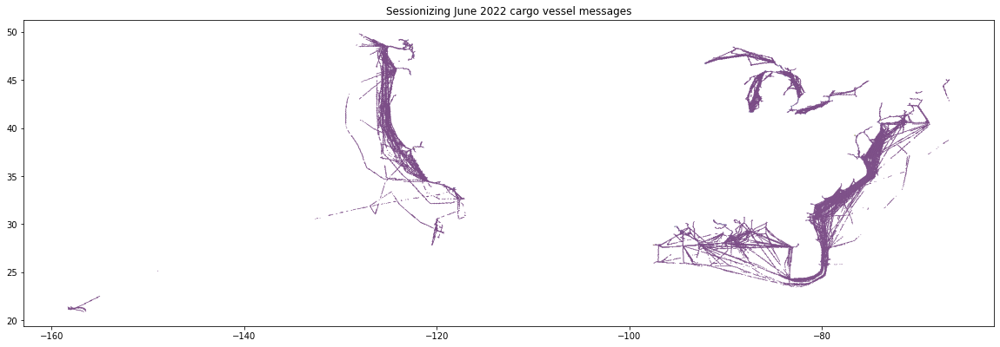

In [0]:
import geopandas as gpd
import matplotlib.pyplot as plt
import h3.api.numpy_int as h3
from shapely.geometry import Polygon

# Convert hex polygons to geospatial polygons
def hex_to_polygon(hex_id):
    hex_id_int = int(hex_id, 16)  # Convert hex string to integer
    geo_json = h3.h3_to_geo_boundary(hex_id_int, geo_json=True)
    return Polygon(geo_json)

# Transform your dataframe to a geopandas dataframe
gdf = gpd.GeoDataFrame(df, geometry=df['h3'].apply(hex_to_polygon))

# Plot the geopandas dataframe
fig, ax = plt.subplots(figsize=(20, 14))
gdf.plot(column='count', ax=ax)
plt.title('Sessionizing June 2022 cargo vessel messages')
plt.show()